In [ ]:
# Extraction_eclairs.ipynb

# Extracts a given region of latitude/longitude for NLDN and GLM
# Plots the amplitude and occurance frequency for NLDN
# Plots flash and group rates, energy and numbers for GLM

# C. Mackay September 2022 (Catherine.Mackay@aero.obs-mip.fr)
# https://github.com/ckmackay/SOFT-IO-LI.git

# Suggestions/improvements to be made:

# This only works for a given geographical zone. Needs to be automated to look wherever the maximum residence time is > max(maximum residence time) and outut the
# data for each 0.5° lat/long square to be added to the IAGOS db. 


In [1]:
from netCDF4 import Dataset
#from ncdump import ncdump
import numpy as np
import pandas as pd
import xarray as xr
import json
import os.path
import tarfile,glob

#for plotting
import hvplot.xarray # fancy plotting for xarray
import holoviews as hv
import matplotlib.pyplot as plt
import geoviews as gv

#for stats
import statistics
from statistics import mean, median, mode, stdev, median_high

#for datetime
import datetime
from datetime import datetime as dt
import matplotlib.dates as mdates
from matplotlib.dates import date2num

#for cartopy
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import cartopy.feature as cfeature

In [4]:
#opens a given GLM file, can be automated to open all required files for a given RELEASE 
#GLM raw data 
ds = xr.open_dataset('/o3p/macc/glm/OR_GLM-L2-LCFA_G16_s2018156/GLM_array_156_05-06.nc')
#ds = xr.open_dataset('/o3p/macc/glm/OR_GLM-L2-LCFA_G16_s2018156/GLM_array_156_07-08.nc')

In [5]:
#plot to check area
#GLM gridded data
dr = xr.open_dataset('/o3p/macc/test/GLM_array_156_05deg/GLM_array_156_05-06_batch_bis.nc')
flash_en = dr.flash_energy.where(dr.flash_energy > 0)
flash_num = dr.num_flash.where(dr.num_flash > 0)
pl7 = (flash_en).hvplot.image(
    x='longitude', y='latitude',  title='Total flash energy',
    xlabel = 'Longitude (°)', ylabel = 'Latitude (°)', clabel = 'Flash energy (J)',
    frame_height=350, 
    projection=ccrs.PlateCarree(),
    geo=True, project=False, #global_extent=True,
    xlim=(-140, -20), ylim=(-40, 80),       #get_extent(-170, -20, -60, 60),
    framewise=False, coastline=True, dynamic=True,
    cmap='spring'
)
pl7

:Overlay
   .Image.I     :Image   [longitude,latitude]   (flash_energy)
   .Coastline.I :Feature   [Longitude,Latitude]

In [6]:
#opens a given NLDN file, can be automated to open all required files for a given RELEASE 
#NLDN gridded data
#plot to check zone

dr = xr.open_dataset('/o3p/macc/nldn/data_netcdf_hours_05deg/2018_6_5_5.nc')
amp = dr.amplitude.where(dr.amplitude > 0)

plnl15 = (amp).hvplot.image(
    x='longitude', y='latitude',  title='NLDN Peak Current', 
    xlabel = 'Longitude (°)', ylabel = 'Latitude (°)', clabel = 'Peak Current (kA)',
    frame_height=350, 
    projection=ccrs.PlateCarree(), 
    geo=True, project=False, #global_extent=True,
    xlim=(-140, -20), ylim=(-60, 60), 
    framewise=False, coastline=True, dynamic=True,
    #cmap='Gnuplot'
    cmap='winter'
)
plnl15

:Overlay
   .Image.I     :Image   [longitude,latitude]   (amplitude)
   .Coastline.I :Feature   [Longitude,Latitude]

In [ ]:
### NLDN

In [7]:
#NLDN raw data

#Check about times, think need to select data between two datetimes


dr = xr.open_dataset('/o3p/macc/nldn/data_netcdf/2018_6_5.nc')

In [8]:
print(dr.amplitude.lat)

<xarray.DataArray 'lat' (record: 85372)>
array([47.1645, 47.6595, 50.0173, ..., 45.5896, 45.562 , 46.793 ])
Coordinates:
  * record   (record) int64 0 1 2 3 4 5 ... 85366 85367 85368 85369 85370 85371
    time     (record) datetime64[ns] ...
    lat      (record) float64 47.16 47.66 50.02 49.87 ... 45.59 45.56 46.79
    lon      (record) float64 ...
Attributes:
    units:          degrees_north
    axis:           Y
    long_name:      latitude
    standard_name:  latitude


In [9]:
# For NLDN raw

def generate_geographical_subset_NLDN(xarray, latmin, latmax, lonmin, lonmax, reassign=False):
    """ 
    Generates a geographical subset of a xarray.DataArray and if kwarg reassign=True, shifts the longitude grid 
    from a 0-360 to a -180 to 180 deg grid.
    
    Parameters:
        xarray(xarray.DataArray): a xarray DataArray with latitude and longitude coordinates
        latmin, latmax, lonmin, lonmax(int): lat/lon boundaries of the geographical subset
        reassign(boolean): default is False
        
    Returns:
        Geographical subset of a xarray.DataArray.
    """   
    if(reassign):
        xarray = xarray.assign_coords(longitude=(((xarray.longitude + 180) % 360) - 180))
    return xarray.where((xarray.lat < latmax) & (xarray.lat > latmin) & (xarray.lon < lonmax) & (xarray.lon > lonmin),drop=True)

In [10]:
dc = generate_geographical_subset_NLDN(dr, 48.5, 49, -103, -102.5, reassign=False)

In [11]:
dc

<xarray.Dataset>
Dimensions:    (record: 1062)
Coordinates:
  * record     (record) int64 53156 53948 54207 54208 ... 75140 75141 75142
    time       (record) datetime64[ns] 2018-06-05T03:51:13.212384768 ... 2018...
    lat        (record) float64 48.9 48.92 48.87 48.88 ... 48.78 48.76 48.75
    lon        (record) float64 -102.9 -102.9 -103.0 ... -102.6 -102.6 -102.5
Data variables:
    amplitude  (record) float64 -10.0 -6.0 53.0 42.0 ... -8.0 -10.0 -6.0 -20.0
    strokes    (record) float64 1.0 0.0 0.0 0.0 1.0 0.0 ... 0.0 0.0 0.0 1.0 0.0
Attributes:
    title:        Cloud to Ground Lightning
    institution:  Data from NLDN, hosted by LAERO Toulouse, France.
    references:   
    featureType:  point
    Conventions:  CF-1.6
    history:      Created by LAERO at 2021-09-01 14:08:20.559468 
    author:       catherine.mackay@aero.obs-mip.fr
    keywords:     lightning

In [12]:
print(len(dc.amplitude))

1062


In [13]:
print(len(dc.strokes))

1062


In [14]:
dc.time

<xarray.DataArray 'time' (record: 1062)>
array(['2018-06-05T03:51:13.212384768', '2018-06-05T03:56:54.038870016',
       '2018-06-05T03:58:51.217637888', ...,
       '2018-06-05T08:00:44.676492032', '2018-06-05T08:00:44.677929216',
       '2018-06-05T08:00:44.857899264'], dtype='datetime64[ns]')
Coordinates:
  * record   (record) int64 53156 53948 54207 54208 ... 75139 75140 75141 75142
    time     (record) datetime64[ns] 2018-06-05T03:51:13.212384768 ... 2018-0...
    lat      (record) float64 48.9 48.92 48.87 48.88 ... 48.76 48.78 48.76 48.75
    lon      (record) float64 -102.9 -102.9 -103.0 ... -102.6 -102.6 -102.5

In [15]:
secs = np.diff(dc.time[373:1007]).astype('float64')/1e9

In [16]:
print(len(secs))

633


In [17]:
t_secs = []

In [18]:
t_secs.append(0)

In [19]:
t_secs = []
t_secs.append(0)
tot=0
for i in range(len(secs)):
    tot = tot+secs[i]
    t_secs.append(tot)

In [20]:
print(len(t_secs))

634


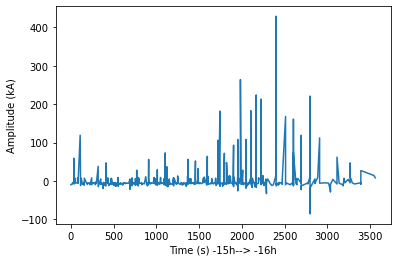

In [21]:
fig, ax1 = plt.subplots()
    
    #fig, ax1 = plt.subplots()
#   fig.set_figwidth(20)
color = 'tab:blue'
ax1.set_ylabel('Amplitude (kA)')
ax1.set_xlabel('Time (s) -15h--> -16h')
#ax1.plot(da.flash_id, da.flash_energy, color=color, label='Flash energy')
num = []
amp = []
count = 0
for i in range(373,1007):
    count = count+1
    num.append(count)
    amp.append(dc.amplitude[i])
    
ax1.plot(t_secs, amp, color=color, label='Flash energy')
#ax1.plot(da.product_time, da.flash_energy, color=color, label='Flash energy')
plt.savefig("/o3p/macc/test/plots/nldn/Stroke.png")
plt.show() 

In [22]:
#sort amplitudes for CDF and histos
data_sorted = np.sort(amp)

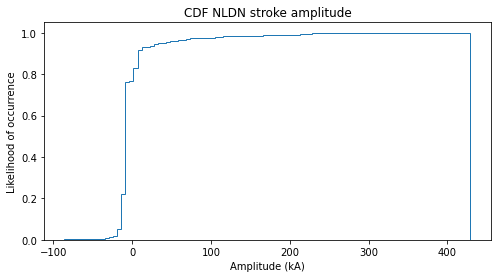

In [23]:
#CDF of amplitude

n_bins = 100

fig, ax = plt.subplots(figsize=(8, 4))

# plot the cumulative histogram
n, bins, patches = ax.hist(data_sorted, n_bins, density=True, histtype='step',
                           cumulative=True) #, label='Empirical')

# Add a line showing the expected distribution.
#y = ((1 / (np.sqrt(2 * np.pi) * sigma)) *
#     np.exp(-0.5 * (1 / sigma * (bins - mu))**2))
#y = y.cumsum()
#y /= y[-1]
#ax.plot(bins, y, 'k--', linewidth=1.5, label='Theoretical')

# Overlay a reversed cumulative histogram.
#ax.hist(data_sorted, bins=bins, density=True, histtype='step', cumulative=-1,
#        label='Reversed emp.')

# tidy up the figure
#ax.grid(True)
#ax.legend(loc='right')
ax.set_title('CDF NLDN stroke amplitude')
ax.set_xlabel('Amplitude (kA)')
ax.set_ylabel('Likelihood of occurrence')

plt.savefig("/o3p/macc/test/plots/nldn/CDFStroke.png")

plt.show()




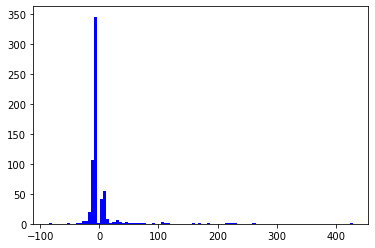

In [24]:
#Histogram amplitude

hx, hy, _ = plt.hist(data_sorted, bins=100, color="blue")

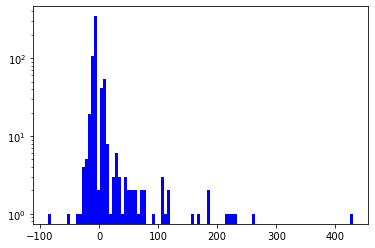

In [25]:
#Histogram amplitude

hx, hy, _ = plt.hist(data_sorted, bins=100, color="blue", log=True)

(array([  1.,   1.,   1.,   1.,   1.,   1.,   2.,   2.,   2.,   3.,   4.,
          8.,  13.,  32., 139., 484., 486., 527., 581., 589., 590., 593.,
        599., 602., 603., 606., 608., 610., 612., 613., 615., 617., 617.,
        617., 618., 618., 618., 621., 622., 624., 624., 624., 624., 624.,
        624., 624., 624., 625., 625., 626., 626., 626., 628., 628., 628.,
        628., 628., 628., 629., 630., 631., 632., 632., 632., 632., 632.,
        632., 633., 633., 633., 633., 633., 633., 633., 633., 633., 633.,
        633., 633., 633., 633., 633., 633., 633., 633., 633., 633., 633.,
        633., 633., 633., 633., 633., 633., 633., 633., 633., 633., 633.,
        634.]),
 array([-86.  , -80.85, -75.7 , -70.55, -65.4 , -60.25, -55.1 , -49.95,
        -44.8 , -39.65, -34.5 , -29.35, -24.2 , -19.05, -13.9 ,  -8.75,
         -3.6 ,   1.55,   6.7 ,  11.85,  17.  ,  22.15,  27.3 ,  32.45,
         37.6 ,  42.75,  47.9 ,  53.05,  58.2 ,  63.35,  68.5 ,  73.65,
         78.8 ,  83.95,  89.1 

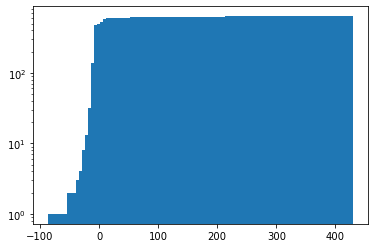

In [26]:
plt.hist(data_sorted, bins=100, cumulative=True, log=True)

In [ ]:
# Look at NLDN gridded data 

#Needs fixing

In [131]:
# open NLDN gridded file
#NLDN raw data
drx = xr.open_dataset('/o3p/macc/nldn/data_netcdf_hours_05deg/2018_6_5_17.nc')


In [132]:
# For NLDN gridded

def generate_geographical_subset_NLDN_gridded(xarray, latmin, latmax, lonmin, lonmax, reassign=False):
    """ 
    Generates a geographical subset of a xarray.DataArray and if kwarg reassign=True, shifts the longitude grid 
    from a 0-360 to a -180 to 180 deg grid.
    
    Parameters:
        xarray(xarray.DataArray): a xarray DataArray with latitude and longitude coordinates
        latmin, latmax, lonmin, lonmax(int): lat/lon boundaries of the geographical subset
        reassign(boolean): default is False
        
    Returns:
        Geographical subset of a xarray.DataArray.
    """   
    if(reassign):
        xarray = xarray.assign_coords(longitude=(((xarray.longitude + 180) % 360) - 180))
    return xarray.where((xarray.latitude < latmax) & (xarray.latitude > latmin) & (xarray.longitude < lonmax) & (xarray.longitude > lonmin),drop=True)

In [133]:
db = generate_geographical_subset_NLDN_gridded(drx, 40.5, 48, -108.5, -100, reassign=False)

In [134]:
db

<xarray.Dataset>
Dimensions:    (latitude: 15, longitude: 17)
Coordinates:
  * latitude   (latitude) float64 40.75 41.25 41.75 42.25 ... 46.75 47.25 47.75
  * longitude  (longitude) float64 -108.2 -107.8 -107.2 ... -101.2 -100.8 -100.2
Data variables:
    amplitude  (latitude, longitude) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    strokes    (latitude, longitude) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0

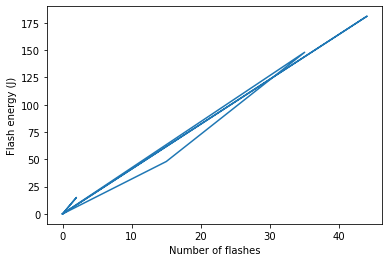

In [144]:
fig, ax1 = plt.subplots()

#db.amplitude = db.amplitude.where(db.amplitude.gt.0.)
#df["date"]=pd.to_datetime(df["date"])


color = 'tab:blue'
ax1.set_ylabel('Flash energy (J)')
ax1.set_xlabel('Number of flashes')
#ax1.plot(da.flash_id, da.flash_energy, color=color, label='Flash energy')
ax1.plot(db.strokes, db.amplitude, color=color, label='Flash energy')
#ax1.plot(da.product_time, da.flash_energy, color=color, label='Flash energy')
plt.savefig("/o3p/macc/test/plots/glm/Flash_energy.png")
plt.show()  

In [142]:
#opens a given NLDN file, can be automated to open all required files for a given RELEASE 
#NLDN gridded data
#plot to check zone

dr = xr.open_dataset('/o3p/macc/nldn/data_netcdf_hours_05deg/2018_6_5_5.nc')
amp = dr.amplitude.where(dr.amplitude > 0)

plnl15 = (amp).hvplot.image(
    x='longitude', y='latitude',  title='NLDN Peak Current', 
    xlabel = 'Longitude (°)', ylabel = 'Latitude (°)', clabel = 'Peak Current (kA)',
    frame_height=350, 
    projection=ccrs.PlateCarree(), 
    geo=True, project=False, #global_extent=True,
    xlim=(-140, -20), ylim=(-60, 60), 
    framewise=False, coastline=True, dynamic=True,
    #cmap='Gnuplot'
    cmap='winter'
)
plnl15

:Overlay
   .Image.I     :Image   [longitude,latitude]   (amplitude)
   .Coastline.I :Feature   [Longitude,Latitude]

In [44]:
#open GLM file
dr = xr.open_dataset('/o3p/macc/test/GLM_array_156_05deg/GLM_array_156_05-06_batch_bis.nc')

In [46]:
#GLM for flash
def generate_geographical_subset_GLM_flash(xarray, latmin, latmax, lonmin, lonmax, reassign=False):
    """ 
    Generates a geographical subset of a xarray.DataArray and if kwarg reassign=True, shifts the longitude grid 
    from a 0-360 to a -180 to 180 deg grid.
    
    Parameters:
        xarray(xarray.DataArray): a xarray DataArray with latitude and longitude coordinates
        latmin, latmax, lonmin, lonmax(int): lat/lon boundaries of the geographical subset
        reassign(boolean): default is False
        
    Returns:
        Geographical subset of a xarray.DataArray.
    """   
    if(reassign):
        xarray = xarray.assign_coords(longitude=(((xarray.longitude + 180) % 360) - 180))
    return xarray.where((xarray.flash_lat < latmax) & (xarray.flash_lat > latmin) & (xarray.flash_lon < lonmax) & (xarray.flash_lon > lonmin),drop=True)

In [47]:
da = generate_geographical_subset_GLM_flash(ds, 48, 48.5, -103.5, -103, reassign=False)

In [48]:
da

<xarray.Dataset>
Dimensions:                                 (number_of_events: 2569667, number_of_field_of_view_bounds: 2, number_of_flashes: 40, number_of_groups: 805719, number_of_time_bounds: 2, number_of_wavelength_bounds: 2)
Coordinates:
    event_id                                (number_of_events) uint32 ...
    event_time_offset                       (number_of_events) datetime64[ns] ...
    event_lat                               (number_of_events) float32 ...
    event_lon                               (number_of_events) float32 ...
    event_parent_group_id                   (number_of_events) uint32 ...
    group_id                                (number_of_groups) uint32 ...
    group_time_offset                       (number_of_groups) datetime64[ns] ...
    group_lat                               (number_of_groups) float32 6.763 ...
    group_lon                               (number_of_groups) float32 -78.36...
    group_parent_flash_id                   (number_of_groups) uint16 ...
    flash_id                                (number_of_flashes) uint16 44328 ...
    flash_time_offset_of_first_event        (number_of_flashes) datetime64[ns] ...
    flash_time_offset_of_last_event         (number_of_flashes) datetime64[ns] ...
    flash_lat                               (number_of_flashes) float32 48.46...
    flash_lon                               (number_of_flashes) float32 -103....
    product_time                            datetime64[ns] 2018-06-05T05:00:00
    lightning_wavelength                    float32 777.4
    group_time_threshold                    float32 0.0
    flash_time_threshold                    float32 3.33
    lat_field_of_view                       float32 0.0
    lon_field_of_view                       float32 -75.0
Dimensions without coordinates: number_of_events, number_of_field_of_view_bounds, number_of_flashes, number_of_groups, number_of_time_bounds, number_of_wavelength_bounds
Data variables:
    event_energy                            (number_of_events, number_of_flashes) float32 ...
    group_area                              (number_of_groups, number_of_flashes) float32 ...
    group_energy                            (number_of_groups, number_of_flashes) float32 ...
    group_quality_flag                      (number_of_groups, number_of_flashes) float32 ...
    flash_area                              (number_of_flashes) float32 82.66...
    flash_energy                            (number_of_flashes) float32 1.984...
    flash_quality_flag                      (number_of_flashes) float32 0.0 ....
    product_time_bounds                     (number_of_time_bounds, number_of_flashes) datetime64[ns] ...
    lightning_wavelength_bounds             (number_of_wavelength_bounds, number_of_flashes) float32 ...
    lat_field_of_view_bounds                (number_of_field_of_view_bounds, number_of_flashes) float32 ...
    goes_lat_lon_projection                 (number_of_flashes) float64 -2.14...
    event_count                             (number_of_flashes) float64 1.412...
    group_count                             (number_of_flashes) float64 5.018...
    flash_count                             (number_of_flashes) float64 189.0...
    percent_navigated_L1b_events            (number_of_flashes) float64 1.0 ....
    yaw_flip_flag                           (number_of_flashes) float64 nan ....
    nominal_satellite_subpoint_lat          (number_of_flashes) float64 0.0 ....
    nominal_satellite_height                (number_of_flashes) float64 3.579...
    nominal_satellite_subpoint_lon          (number_of_flashes) float64 -75.0...
    lon_field_of_view_bounds                (number_of_field_of_view_bounds, number_of_flashes) float32 ...
    percent_uncorrectable_L0_errors         (number_of_flashes) float64 0.0 ....
    algorithm_dynamic_input_data_container  (number_of_flashes) float64 -2.14...
    processing_parm_version_container       (number_of_flashes) float64 -2.14...
    alg

In [50]:
#GLM for group

def generate_geographical_subset_GLM_group(xarray, latmin, latmax, lonmin, lonmax, reassign=False):
    """ 
    Generates a geographical subset of a xarray.DataArray and if kwarg reassign=True, shifts the longitude grid 
    from a 0-360 to a -180 to 180 deg grid.
    
    Parameters:
        xarray(xarray.DataArray): a xarray DataArray with latitude and longitude coordinates
        latmin, latmax, lonmin, lonmax(int): lat/lon boundaries of the geographical subset
        reassign(boolean): default is False
        
    Returns:
        Geographical subset of a xarray.DataArray.
    """   
    if(reassign):
        xarray = xarray.assign_coords(longitude=(((xarray.longitude + 180) % 360) - 180))
    return xarray.where((xarray.group_lat < latmax) & (xarray.group_lat > latmin) & (xarray.group_lon < lonmax) & (xarray.group_lon > lonmin),drop=True)

In [51]:
dd = generate_geographical_subset_GLM_group(ds, 48, 48.5, -103.5, -103, reassign=False)

In [52]:
dd

<xarray.Dataset>
Dimensions:                                 (number_of_events: 2569667, number_of_field_of_view_bounds: 2, number_of_flashes: 32991, number_of_groups: 183, number_of_time_bounds: 2, number_of_wavelength_bounds: 2)
Coordinates:
    event_id                                (number_of_events) uint32 ...
    event_time_offset                       (number_of_events) datetime64[ns] ...
    event_lat                               (number_of_events) float32 ...
    event_lon                               (number_of_events) float32 ...
    event_parent_group_id                   (number_of_events) uint32 ...
    group_id                                (number_of_groups) uint32 6722997...
    group_time_offset                       (number_of_groups) datetime64[ns] ...
    group_lat                               (number_of_groups) float32 48.46 ...
    group_lon                               (number_of_groups) float32 -103.3...
    group_parent_flash_id                   (number_of_groups) uint16 44328 ....
    flash_id                                (number_of_flashes) uint16 ...
    flash_time_offset_of_first_event        (number_of_flashes) datetime64[ns] ...
    flash_time_offset_of_last_event         (number_of_flashes) datetime64[ns] ...
    flash_lat                               (number_of_flashes) float32 6.724...
    flash_lon                               (number_of_flashes) float32 -78.4...
    product_time                            datetime64[ns] 2018-06-05T05:00:00
    lightning_wavelength                    float32 777.4
    group_time_threshold                    float32 0.0
    flash_time_threshold                    float32 3.33
    lat_field_of_view                       float32 0.0
    lon_field_of_view                       float32 -75.0
Dimensions without coordinates: number_of_events, number_of_field_of_view_bounds, number_of_flashes, number_of_groups, number_of_time_bounds, number_of_wavelength_bounds
Data variables:
    event_energy                            (number_of_events, number_of_groups) float32 ...
    group_area                              (number_of_groups) float32 82.66 ...
    group_energy                            (number_of_groups) float32 7.63e-...
    group_quality_flag                      (number_of_groups) float32 0.0 .....
    flash_area                              (number_of_flashes, number_of_groups) float32 ...
    flash_energy                            (number_of_flashes, number_of_groups) float32 ...
    flash_quality_flag                      (number_of_flashes, number_of_groups) float32 ...
    product_time_bounds                     (number_of_time_bounds, number_of_groups) datetime64[ns] ...
    lightning_wavelength_bounds             (number_of_wavelength_bounds, number_of_groups) float32 ...
    lat_field_of_view_bounds                (number_of_field_of_view_bounds, number_of_groups) float32 ...
    goes_lat_lon_projection                 (number_of_groups) float64 -2.147...
    event_count                             (number_of_groups) float64 1.412e...
    group_count                             (number_of_groups) float64 5.018e...
    flash_count                             (number_of_groups) float64 189.0 ...
    percent_navigated_L1b_events            (number_of_groups) float64 1.0 .....
    yaw_flip_flag                           (number_of_groups) float64 nan .....
    nominal_satellite_subpoint_lat          (number_of_groups) float64 0.0 .....
    nominal_satellite_height                (number_of_groups) float64 3.579e...
    nominal_satellite_subpoint_lon          (number_of_groups) float64 -75.0 ...
    lon_field_of_view_bounds                (number_of_field_of_view_bounds, number_of_groups) float32 ...
    percent_uncorrectable_L0_errors         (number_of_groups) float64 0.0 .....
    algorithm_dynamic_input_data_container  (number_of_groups) float64 -2.147...
    processing_parm_version_container       (number_of_groups) float64 -2.147...
    

In [53]:
da

<xarray.Dataset>
Dimensions:                                 (number_of_events: 2569667, number_of_field_of_view_bounds: 2, number_of_flashes: 40, number_of_groups: 805719, number_of_time_bounds: 2, number_of_wavelength_bounds: 2)
Coordinates:
    event_id                                (number_of_events) uint32 ...
    event_time_offset                       (number_of_events) datetime64[ns] ...
    event_lat                               (number_of_events) float32 ...
    event_lon                               (number_of_events) float32 ...
    event_parent_group_id                   (number_of_events) uint32 ...
    group_id                                (number_of_groups) uint32 ...
    group_time_offset                       (number_of_groups) datetime64[ns] ...
    group_lat                               (number_of_groups) float32 6.763 ...
    group_lon                               (number_of_groups) float32 -78.36...
    group_parent_flash_id                   (number_of_groups) uint16 ...
    flash_id                                (number_of_flashes) uint16 44328 ...
    flash_time_offset_of_first_event        (number_of_flashes) datetime64[ns] ...
    flash_time_offset_of_last_event         (number_of_flashes) datetime64[ns] ...
    flash_lat                               (number_of_flashes) float32 48.46...
    flash_lon                               (number_of_flashes) float32 -103....
    product_time                            datetime64[ns] 2018-06-05T05:00:00
    lightning_wavelength                    float32 777.4
    group_time_threshold                    float32 0.0
    flash_time_threshold                    float32 3.33
    lat_field_of_view                       float32 0.0
    lon_field_of_view                       float32 -75.0
Dimensions without coordinates: number_of_events, number_of_field_of_view_bounds, number_of_flashes, number_of_groups, number_of_time_bounds, number_of_wavelength_bounds
Data variables:
    event_energy                            (number_of_events, number_of_flashes) float32 ...
    group_area                              (number_of_groups, number_of_flashes) float32 ...
    group_energy                            (number_of_groups, number_of_flashes) float32 ...
    group_quality_flag                      (number_of_groups, number_of_flashes) float32 ...
    flash_area                              (number_of_flashes) float32 82.66...
    flash_energy                            (number_of_flashes) float32 1.984...
    flash_quality_flag                      (number_of_flashes) float32 0.0 ....
    product_time_bounds                     (number_of_time_bounds, number_of_flashes) datetime64[ns] ...
    lightning_wavelength_bounds             (number_of_wavelength_bounds, number_of_flashes) float32 ...
    lat_field_of_view_bounds                (number_of_field_of_view_bounds, number_of_flashes) float32 ...
    goes_lat_lon_projection                 (number_of_flashes) float64 -2.14...
    event_count                             (number_of_flashes) float64 1.412...
    group_count                             (number_of_flashes) float64 5.018...
    flash_count                             (number_of_flashes) float64 189.0...
    percent_navigated_L1b_events            (number_of_flashes) float64 1.0 ....
    yaw_flip_flag                           (number_of_flashes) float64 nan ....
    nominal_satellite_subpoint_lat          (number_of_flashes) float64 0.0 ....
    nominal_satellite_height                (number_of_flashes) float64 3.579...
    nominal_satellite_subpoint_lon          (number_of_flashes) float64 -75.0...
    lon_field_of_view_bounds                (number_of_field_of_view_bounds, number_of_flashes) float32 ...
    percent_uncorrectable_L0_errors         (number_of_flashes) float64 0.0 ....
    algorithm_dynamic_input_data_container  (number_of_flashes) float64 -2.14...
    processing_parm_version_container       (number_of_flashes) float64 -2.14...
    alg

In [54]:
flash_en = ds.flash_energy.where(ds.flash_energy > 0)
flash_num = ds.flash_area.where(ds.flash_area > 0)

In [55]:
flash_en_a = da.flash_energy.where(da.flash_energy > 0)
#flash_num = ds.flash_area.where(ds.flash_area > 0)

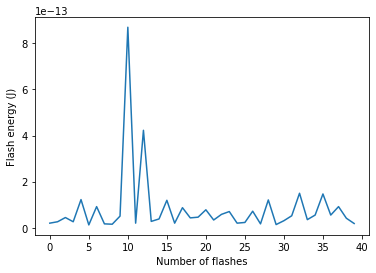

In [73]:
fig, ax1 = plt.subplots()
    
    #fig, ax1 = plt.subplots()
#   fig.set_figwidth(20)
color = 'tab:blue'
ax1.set_ylabel('Flash energy (J)')
ax1.set_xlabel('Number of flashes')
#ax1.plot(da.flash_id, da.flash_energy, color=color, label='Flash energy')
ax1.plot(da.number_of_flashes, da.flash_energy, color=color, label='Flash energy')
#ax1.plot(da.product_time, da.flash_energy, color=color, label='Flash energy')
plt.savefig("/o3p/macc/test/plots/glm/Flash_energy.png")
plt.show()  

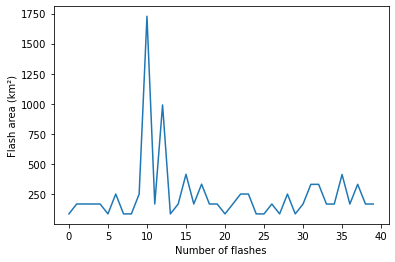

In [74]:
fig, ax1 = plt.subplots()
    
    #fig, ax1 = plt.subplots()
#   fig.set_figwidth(20)
color = 'tab:blue'
ax1.set_ylabel('Flash area (km²)')
ax1.set_xlabel('Number of flashes')
#ax1.plot(da.flash_id, da.flash_energy, color=color, label='Flash energy')
ax1.plot(da.number_of_flashes, da.flash_area, color=color, label='Flash energy')
#ax1.plot(da.product_time, da.flash_energy, color=color, label='Flash energy')
 

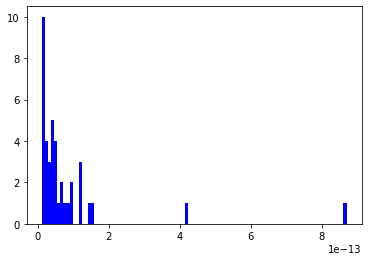

In [75]:
data_sorted = np.sort(da.flash_energy)

hx, hy, _ = plt.hist(data_sorted, bins=100, color="blue")

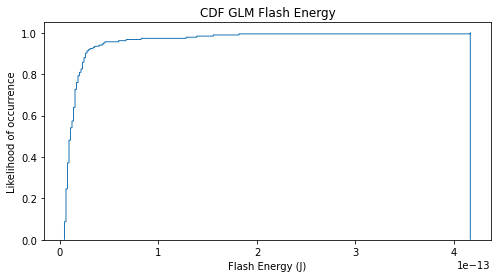

In [81]:
#CDF of flash energy

n_bins = 1000000

fig, ax = plt.subplots(figsize=(8, 4))

# plot the cumulative histogram
n, bins, patches = ax.hist(data_sorted, n_bins, density=True, histtype='step',
                           cumulative=True) #, label='Empirical')

# tidy up the figure
#ax.grid(True)
#ax.legend(loc='right')
ax.set_title('CDF GLM Flash Energy')
ax.set_xlabel('Flash Energy (J)')
ax.set_ylabel('Likelihood of occurrence')

plt.savefig("/o3p/macc/test/plots/glm/CDFFlash.png")

plt.show()


In [63]:
dr = xr.open_dataset('/o3p/macc/test/GLM_array_156_05deg/GLM_array_156_05-06_batch_bis.nc')
flash_en = dr.flash_energy.where(dr.flash_energy > 0)
flash_num = dr.num_flash.where(dr.num_flash > 0)
pl7 = (flash_en).hvplot.image(
    x='longitude', y='latitude',  title='Total flash energy',
    xlabel = 'Longitude (°)', ylabel = 'Latitude (°)', clabel = 'Flash energy (J)',
    frame_height=350, 
    projection=ccrs.PlateCarree(),
    geo=True, project=False, #global_extent=True,
    xlim=(-140, -20), ylim=(-40, 80),       #get_extent(-170, -20, -60, 60),
    framewise=False, coastline=True, dynamic=True,
    cmap='spring'
)
pl7

:Overlay
   .Image.I     :Image   [longitude,latitude]   (flash_energy)
   .Coastline.I :Feature   [Longitude,Latitude]

In [66]:
ds = xr.open_dataset('/o3p/macc/glm/OR_GLM-L2-LCFA_G16_s2018156/GLM_array_156_05-06.nc')


In [67]:
ds

<xarray.Dataset>
Dimensions:                                 (number_of_events: 2569667, number_of_field_of_view_bounds: 2, number_of_flashes: 32991, number_of_groups: 805719, number_of_time_bounds: 2, number_of_wavelength_bounds: 2)
Coordinates:
    event_id                                (number_of_events) uint32 ...
    event_time_offset                       (number_of_events) datetime64[ns] ...
    event_lat                               (number_of_events) float32 ...
    event_lon                               (number_of_events) float32 ...
    event_parent_group_id                   (number_of_events) uint32 ...
    group_id                                (number_of_groups) uint32 ...
    group_time_offset                       (number_of_groups) datetime64[ns] ...
    group_lat                               (number_of_groups) float32 ...
    group_lon                               (number_of_groups) float32 ...
    group_parent_flash_id                   (number_of_groups) uint16 ...
    flash_id                                (number_of_flashes) uint16 ...
    flash_time_offset_of_first_event        (number_of_flashes) datetime64[ns] ...
    flash_time_offset_of_last_event         (number_of_flashes) datetime64[ns] ...
    flash_lat                               (number_of_flashes) float32 ...
    flash_lon                               (number_of_flashes) float32 ...
    product_time                            datetime64[ns] ...
    lightning_wavelength                    float32 ...
    group_time_threshold                    float32 ...
    flash_time_threshold                    float32 ...
    lat_field_of_view                       float32 ...
    lon_field_of_view                       float32 ...
Dimensions without coordinates: number_of_events, number_of_field_of_view_bounds, number_of_flashes, number_of_groups, number_of_time_bounds, number_of_wavelength_bounds
Data variables:
    event_energy                            (number_of_events) float32 ...
    group_area                              (number_of_groups) float32 ...
    group_energy                            (number_of_groups) float32 ...
    group_quality_flag                      (number_of_groups) float32 ...
    flash_area                              (number_of_flashes) float32 ...
    flash_energy                            (number_of_flashes) float32 ...
    flash_quality_flag                      (number_of_flashes) float32 ...
    product_time_bounds                     (number_of_time_bounds) datetime64[ns] ...
    lightning_wavelength_bounds             (number_of_wavelength_bounds) float32 ...
    lat_field_of_view_bounds                (number_of_field_of_view_bounds) float32 ...
    goes_lat_lon_projection                 int32 ...
    event_count                             float64 ...
    group_count                             float64 ...
    flash_count                             float64 ...
    percent_navigated_L1b_events            float32 ...
    yaw_flip_flag                           float32 ...
    nominal_satellite_subpoint_lat          float32 ...
    nominal_satellite_height                float32 ...
    nominal_satellite_subpoint_lon          float32 ...
    lon_field_of_view_bounds                (number_of_field_of_view_bounds) float32 ...
    percent_uncorrectable_L0_errors         float32 ...
    algorithm_dynamic_input_data_container  int32 ...
    processing_parm_version_container       int32 ...
    algorithm_product_version_container     int32 ...
Attributes:
    production_site:           WCDAS
    featureType:               point
    orbital_slot:              GOES-East
    platform_ID:               G16
    dataset_name:              OR_GLM-L2-LCFA_G16_s20181560500000_e2018156050...
    naming_authority:          gov.nesdis.noaa
    institution:               DOC/NOAA/NESDIS> U.S. Department of Commerce, ...
    project:                   GOES
    iso_series_metadata_id:    f5816f53-fd6d-11e3-a3ac-0800200c9a

In [68]:
dd = generate_geographical_subset(ds, 48, 48.5, -103.5, -103, reassign=False)

In [69]:
dd

<xarray.Dataset>
Dimensions:                                 (number_of_events: 2569667, number_of_field_of_view_bounds: 2, number_of_flashes: 32991, number_of_groups: 183, number_of_time_bounds: 2, number_of_wavelength_bounds: 2)
Coordinates:
    event_id                                (number_of_events) uint32 ...
    event_time_offset                       (number_of_events) datetime64[ns] ...
    event_lat                               (number_of_events) float32 ...
    event_lon                               (number_of_events) float32 ...
    event_parent_group_id                   (number_of_events) uint32 ...
    group_id                                (number_of_groups) uint32 6722997...
    group_time_offset                       (number_of_groups) datetime64[ns] ...
    group_lat                               (number_of_groups) float32 48.46 ...
    group_lon                               (number_of_groups) float32 -103.3...
    group_parent_flash_id                   (number_of_groups) uint16 44328 ....
    flash_id                                (number_of_flashes) uint16 43941 ...
    flash_time_offset_of_first_event        (number_of_flashes) datetime64[ns] ...
    flash_time_offset_of_last_event         (number_of_flashes) datetime64[ns] ...
    flash_lat                               (number_of_flashes) float32 6.724...
    flash_lon                               (number_of_flashes) float32 -78.4...
    product_time                            datetime64[ns] 2018-06-05T05:00:00
    lightning_wavelength                    float32 777.4
    group_time_threshold                    float32 0.0
    flash_time_threshold                    float32 3.33
    lat_field_of_view                       float32 0.0
    lon_field_of_view                       float32 -75.0
Dimensions without coordinates: number_of_events, number_of_field_of_view_bounds, number_of_flashes, number_of_groups, number_of_time_bounds, number_of_wavelength_bounds
Data variables:
    event_energy                            (number_of_events, number_of_groups) float32 ...
    group_area                              (number_of_groups) float32 82.66 ...
    group_energy                            (number_of_groups) float32 7.63e-...
    group_quality_flag                      (number_of_groups) float32 0.0 .....
    flash_area                              (number_of_flashes, number_of_groups) float32 ...
    flash_energy                            (number_of_flashes, number_of_groups) float32 ...
    flash_quality_flag                      (number_of_flashes, number_of_groups) float32 ...
    product_time_bounds                     (number_of_time_bounds, number_of_groups) datetime64[ns] ...
    lightning_wavelength_bounds             (number_of_wavelength_bounds, number_of_groups) float32 ...
    lat_field_of_view_bounds                (number_of_field_of_view_bounds, number_of_groups) float32 ...
    goes_lat_lon_projection                 (number_of_groups) float64 -2.147...
    event_count                             (number_of_groups) float64 1.412e...
    group_count                             (number_of_groups) float64 5.018e...
    flash_count                             (number_of_groups) float64 189.0 ...
    percent_navigated_L1b_events            (number_of_groups) float64 1.0 .....
    yaw_flip_flag                           (number_of_groups) float64 nan .....
    nominal_satellite_subpoint_lat          (number_of_groups) float64 0.0 .....
    nominal_satellite_height                (number_of_groups) float64 3.579e...
    nominal_satellite_subpoint_lon          (number_of_groups) float64 -75.0 ...
    lon_field_of_view_bounds                (number_of_field_of_view_bounds, number_of_groups) float32 ...
    percent_uncorrectable_L0_errors         (number_of_groups) float64 0.0 .....
    algorithm_dynamic_input_data_container  (number_of_groups) float64 -2.147...
    processing_parm_version_container       (number_of_groups) float64 -2.147..

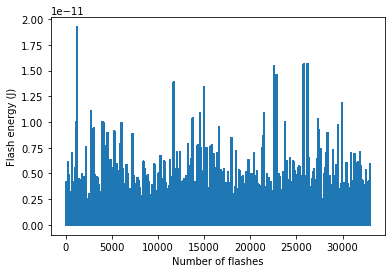

In [70]:
fig, ax1 = plt.subplots()
    
    #fig, ax1 = plt.subplots()
#   fig.set_figwidth(20)
color = 'tab:blue'
ax1.set_ylabel('Flash energy (J)')
ax1.set_xlabel('Number of flashes')
#ax1.plot(da.flash_id, da.flash_energy, color=color, label='Flash energy')
ax1.plot(dd.number_of_flashes, dd.flash_energy, color=color, label='Flash energy')
#ax1.plot(da.product_time, da.flash_energy, color=color, label='Flash energy')
plt.savefig("/o3p/macc/test/plots/glm/Flash_energy.png")
plt.show()

In [ ]:
#GLM Group infomation

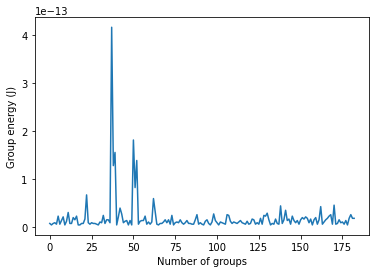

In [77]:
fig, ax1 = plt.subplots()
    
    #fig, ax1 = plt.subplots()
#   fig.set_figwidth(20)
color = 'tab:blue'
ax1.set_ylabel('Group energy (J)')
ax1.set_xlabel('Number of groups')
#ax1.plot(da.flash_id, da.flash_energy, color=color, label='Flash energy')
ax1.plot(dd.number_of_groups, dd.group_energy, color=color, label='Group energy')
#ax1.plot(da.product_time, da.flash_energy, color=color, label='Flash energy')
plt.savefig("/o3p/macc/test/plots/glm/Flash_energy.png")
plt.show()  

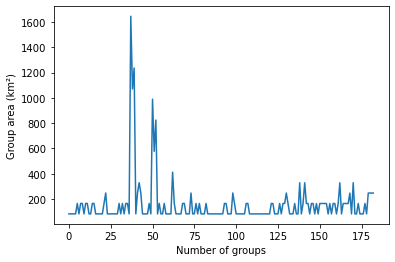

In [78]:
fig, ax1 = plt.subplots()
    
    #fig, ax1 = plt.subplots()
#   fig.set_figwidth(20)
color = 'tab:blue'
ax1.set_ylabel('Group area (km²)')
ax1.set_xlabel('Number of groups')
#ax1.plot(da.flash_id, da.flash_energy, color=color, label='Flash energy')
ax1.plot(dd.number_of_groups, dd.group_area, color=color, label='Group energy')
#ax1.plot(da.product_time, da.flash_energy, color=color, label='Flash energy')

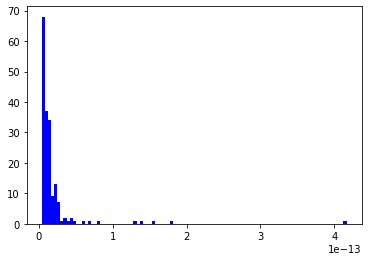

In [79]:
data_sorted = np.sort(dd.group_energy)

hx, hy, _ = plt.hist(data_sorted, bins=100, color="blue")

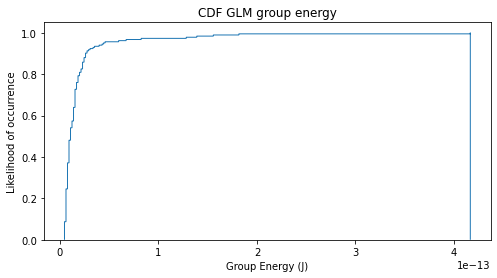

In [80]:
#CDF of group energy

n_bins = 1000000

fig, ax = plt.subplots(figsize=(8, 4))

# plot the cumulative histogram
n, bins, patches = ax.hist(data_sorted, n_bins, density=True, histtype='step',
                           cumulative=True) #, label='Empirical')

# tidy up the figure
#ax.grid(True)
#ax.legend(loc='right')
ax.set_title('CDF GLM group energy')
ax.set_xlabel('Group Energy (J)')
ax.set_ylabel('Likelihood of occurrence')

plt.savefig("/o3p/macc/test/plots/glm/CDFGroup.png")

plt.show()
